# Basic Datashader and Holoviews

Datashader is a Python package for rendering graphics of large datasets.

- Graphics with high fidelity to source data
- Easy rendering and processing
- Dynamic

Depends on:

- Numba
- Dask
- Holoviews

Datashader tackles few common plotting pitfalls

- Overplotting
- Over and under saturation
- Undersampling
- Color mapping

Learn more from Datashader [documentation](https://datashader.org/user_guide/Plotting_Pitfalls.html)

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import datashader as ds

import branca.colormap
from collections import defaultdict
import folium
import webbrowser
from folium.plugins import HeatMap 

import holoviews as hv
from holoviews.element import tiles, EsriImagery
from holoviews.operation.datashader import datashade, dynspread, rasterize

import colorcet as cc
import param
import panel as pn

/opt/miniconda3/envs/geoenv/lib/python3.11/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/var/folders/s3/hn_b7b592ds9ws3gm7g38r3n4f2n9c/T/ipykernel_10187/290743514.py:2: DeprecationWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas still uses PyGEOS by default. However, starting with version 0.14, the default will switch to Shapely. To force to use Shapely 2.0 now, you can either uninstall PyGEOS or set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In the next release, GeoPandas will switch to using Shapely by default, even if PyGEOS is installed. If you only have PyGEOS installed to get speed-ups, this switch should 

In [2]:
hv.extension('bokeh', logo=False)

## Path to datasets

In [3]:
seating = "../../data/raw/Seat/Seat.shp"
parks = "../../data/raw/FL_-_Parks/FL_PARKS.shp"
trees = "../../data/raw/Urban_Forest/Urban_Forest.shp"

In [4]:
sdf_seating = gpd.read_file(seating)
sdf_seating.shape

(6514, 19)

In [5]:
sdf_seating.head()

,OBJECTID,SAPOBJECTI,CLASS,GIS_USER_S,OBJECT_TYP,GIS_SYSTEM,SEAT_TYPE,SEAT_STYLE,SEAT_MATER,NO_OF_PLAC,ARMRESTS,SLAB,FINISH,FUNCTIONAL,SUPERORD_E,GIS_DESCRI,SORT_FIELD,GlobalID,geometry
0,1,000000006000109164,SEAT,INSV,SEAT,INST,BENCH WITH BACK,ALUMINIUM STYLE BENCH,ALUMINIUM,4.0,N,Y,POWDERCOATED,R-C-CENTRALSTREETXX,NaN,SEAT,6920,{062B0369-960A-412C-B9E9-262D1D3FD739},POINT (153.40740 -27.94935)
1,2,000000006000122608,SEAT,INSV,SEAT,INST,BENCH,STONE SEAT,STONE,1.0,N,N,NaN,R-Y-YOUNGSTREETXXXX,NaN,Seat,NaN,{809D184B-1197-4314-8809-9BF2C324AD15},POINT (153.41433 -27.96862)
2,3,000000006000108920,SEAT,INSV,SEAT,INST,BENCH WITH BACK,OLD STYLE TIMBER BENCH,TIMBER AND CONCRETE,NaN,Y,N,NaN,R-C-CAVILLAVENUEXXX,NaN,SEAT.,79375,{EBF5F524-ACF0-4BCC-B69B-0688508BB314},POINT (153.43046 -28.00218)
3,4,000000006000109171,SEAT,INSV,SEAT,INST,BENCH WITH BACK,ALUMINIUM STYLE BENCH,ALUMINIUM AND STEEL,4.0,N,N,PAINTED,R-C-CONNORSTREETXXX,NaN,SEAT,6930,{DFA235DD-34D3-4788-B2A4-6708FC8539E3},POINT (153.45186 -28.09027)
4,5,000000006000104550,SEAT,INSV,SEAT,INST,BENCH WITH BACK,ALUMINIUM STYLE BENCH,ALUMINIUM AND STEEL,4.0,Y,Y,POWDERCOATED,R-K-KILLARNEYAVENUE,NaN,SEAT,59286,{BA6143A1-2A5F-4117-A60D-9D51736B63C0},POINT (153.39899 -28.06949)


In [6]:
sdf_seating.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## The problem with overplotting

<Axes: >

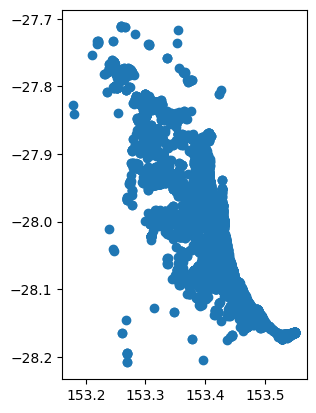

In [7]:
sdf_seating.plot()

In [8]:
map_obj = folium.Map(location = [-28.049901, 153.439891], tiles="Stamen Terrain", zoom_start = 10)

def plot_xy(geo_df):
    """
    This function plots points and add them to Folium map object
    """
    folium.CircleMarker(location=[geo_df.geometry.y, geo_df.geometry.x], radius=2, weight=2).add_to(map_obj)


sdf_seating.apply(plot_xy, axis = 1)

map_obj

In [9]:
map_obj = folium.Map(location = [-28.049901, 153.439891], tiles="Stamen Terrain", zoom_start = 10)

lat = sdf_seating.geometry.y
long = sdf_seating.geometry.x
count = [1] * sdf_seating.shape[0]

steps=10
colormap = branca.colormap.linear.YlOrRd_09.scale(0, 200).to_step(steps)
gradient_map=defaultdict(dict)
for i in range(steps):
    gradient_map[1/steps*i] = colormap.rgb_hex_str(1/steps*i)
colormap.add_to(map_obj) #add color bar at the top of the map

HeatMap(zip(lat, long, count)).add_to(map_obj)
map_obj

## Using Datashader and Holoviews

In [10]:
long_x, lat_y = ds.utils.lnglat_to_meters(long, lat)

In [11]:
map_tiles  = EsriImagery().opts(alpha=0.9, height=800, width=800, bgcolor='black', 
                                aspect="equal", 
                                xlabel="Longitude", ylabel="Latitude")

peopleg = datashade(hv.Points((long_x, lat_y)), 
                    x_sampling=1, 
                    y_sampling=1, 
                    cmap=cc.fire, width=800).opts(title="Seating", 
                                                  fontsize={'title': 36, 
                                                            'labels': 26, 
                                                            'xticks': 26,
                                                            'yticks': 26,})


figure01 = (map_tiles * peopleg)
figure01

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [x,y]   (R,G,B,A)

In [12]:
sdf_parks = gpd.read_file(parks)
sdf_parks.shape

(2281, 11)

In [13]:
sdf_seating = sdf_seating.to_crs("+proj=utm +zone=50 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=m +no_defs +type=crs")
sdf_seating.crs

<Bound CRS: +proj=utm +zone=50 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS 1980 ellipsoid using towgs84=0,0,0,0,0,0,0
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

In [14]:
sdf_parks = sdf_parks.to_crs("+proj=utm +zone=50 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=m +no_defs +type=crs")
sdf_parks.crs

<Bound CRS: +proj=utm +zone=50 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS 1980 ellipsoid using towgs84=0,0,0,0,0,0,0
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

In [15]:
sdf_nearest = sdf_seating[["CLASS", "geometry"]].sjoin_nearest(sdf_parks[["GIS_DESCRI", "geometry"]], how="left", distance_col="Distance_nearest_park")
sdf_nearest.shape

(6514, 5)

In [16]:
sdf_nearest.head()

,CLASS,geometry,index_right,GIS_DESCRI,Distance_nearest_park
0,SEAT,POINT (4215772.073 6301201.012),2134,LEN FOX PARK,249.254571
1,SEAT,POINT (4215707.121 6298568.639),1282,WOODROFFE PARK,277.716431
2,SEAT,POINT (4216036.882 6293828.879),250,SURFERS ESPLANADE PARK URBAN PRECINCT,79.600984
3,SEAT,POINT (4214603.979 6282186.373),945,MEMORIAL PARK,89.144634
4,SEAT,POINT (4209728.837 6286746.846),630,TROON COURT RESERVE,176.805120


In [17]:
park_seating = sdf_nearest[["CLASS", "GIS_DESCRI"]].groupby(["GIS_DESCRI"]).count().reset_index()
park_seating

,GIS_DESCRI,CLASS
0,ABBOTT PARK,10
1,ABRAHAM PARK,16
2,ACANTHUS PARK,1
3,ADINA PARK,1
4,ALAN NIELSEN PARK,4
...,...,...
1000,XENIA PARK,15
1001,YALDARA PARK,4
1002,YARRIMBAH DRIVE RESERVE,1
1003,YOUR PARK,3


In [18]:
park_seating = park_seating.rename(columns={"CLASS": "Seat count"})
park_seating

,GIS_DESCRI,Seat count
0,ABBOTT PARK,10
1,ABRAHAM PARK,16
2,ACANTHUS PARK,1
3,ADINA PARK,1
4,ALAN NIELSEN PARK,4
...,...,...
1000,XENIA PARK,15
1001,YALDARA PARK,4
1002,YARRIMBAH DRIVE RESERVE,1
1003,YOUR PARK,3


In [19]:
summary_park_seating = park_seating.merge(sdf_parks, on="GIS_DESCRI", how="left")
summary_park_seating.head(3)

,GIS_DESCRI,Seat count,OBJECTID,CLASS,GIS_ACQUIS,GIS_OWNER,AREA_SQM,CREATED_DA,LAST_EDITE,SHAPE_Leng,SHAPE_Area,geometry
0,ABBOTT PARK,10,1718,PARK,UN,TBA,47990.0,2018-05-18,2022-12-08,0.015385,4.393740e-06,"POLYGON ((4211537.145 6302760.997, 4211547.175..."
1,ABRAHAM PARK,16,781,PARK,UN,TBA,30009.0,2018-05-18,2020-04-16,0.006991,2.745476e-06,"POLYGON ((4208086.914 6315112.711, 4208076.324..."
2,ACANTHUS PARK,1,1270,PARK,UN,TBA,3731.0,2018-05-18,2018-05-18,0.003617,3.420856e-07,"POLYGON ((4213419.160 6282439.831, 4213466.262..."


In [20]:
type(summary_park_seating)

pandas.core.frame.DataFrame

In [21]:
summary_park_seating = gpd.GeoDataFrame(summary_park_seating, crs="EPSG:4326", geometry=summary_park_seating["geometry"])  
type(summary_park_seating)

geopandas.geodataframe.GeoDataFrame

In [22]:
summary_park_seating = summary_park_seating.to_crs("EPSG:3857")
summary_park_seating.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [24]:
def hook(plot, element):
    plot.handles['colorbar'].major_label_text_font_size="36px"
    plot.handles['colorbar'].title="Number of seats"
    plot.handles['colorbar'].title_text_font_size = '36pt'


map_tiles  = EsriImagery().opts(alpha=0.3, height=800, width=800, 
                               bgcolor='white', aspect="equal", 
                               xlabel="Longitude", ylabel="Latitude", xaxis=None, yaxis=None)

 
cloropleth = rasterize(hv.Polygons(summary_park_seating, vdims=['Seat count']),
                       aggregator=ds.sum('Seat count'),
                       x_sampling=1, y_sampling=1, width=800).opts(title=f"Number of seats per park", 
                                                                   cmap="plasma_r",
                                                                   fontsize={'title': 42, # 'labels': 12, 'xticks': 12,'yticks': 12, 'legend':40
                                                                            },
                                                                   colorbar=True
                                                                  )

 


cloropleth.opts(hooks=[hook])

figure = (map_tiles * cloropleth);
figure

/opt/miniconda3/envs/geoenv/lib/python3.11/site-packages/holoviews/operation/datashader.py:1310: UserWarning: rename 'x' to 'x' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  agg = agg.rename({'x': xdim.name, 'y': ydim.name})
/opt/miniconda3/envs/geoenv/lib/python3.11/site-packages/holoviews/operation/datashader.py:1310: UserWarning: rename 'y' to 'y' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  agg = agg.rename({'x': xdim.name, 'y': ydim.name})
/opt/miniconda3/envs/geoenv/lib/python3.11/site-packages/holoviews/operation/datashader.py:1310: UserWarning: rename 'x' to 'x' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  agg = agg.rename({'x': xdim.name, 'y': ydim.name})
/opt/miniconda3/envs/geoenv/lib/python3.11/site-packages/holoviews/operation/datas

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [x,y]   (x_y Seat count)